In [1]:
import os
from glob import glob
from tqdm import tqdm
import cv2
import matplotlib.pyplot as plt
# plt.rc('font', family='NanumGothic')
import matplotlib.font_manager as fm
# fm.get_fontconfig_fonts()
# # font_location = '/usr/share/fonts/truetype/nanum/NanumGothicOTF.ttf'
# font_location = 'C:/Windows/Fonts/H2GPRM.ttf' # For Windows
# font_name = fm.FontProperties(fname=font_location).get_name()
# plt.rc('font', family=font_name)
plt.rcParams['font.family'] = 'Malgun Gothic'
plt.rcParams['axes.unicode_minus'] =False
import pandas as pd
import numpy as np

In [3]:
import shutil

p = './data/ori_train/*/*'
ori_img_list = glob(p)

p  = './data/train/*/*'
curr_img_list = glob(p)

for img_path in tqdm(ori_img_list) :
    new_img_path = img_path.replace("ori_train", "combine_train")
    dir_ = os.path.dirname(new_img_path)
    name_ = os.path.basename(new_img_path)
    os.makedirs(dir_, exist_ok=True)
    
    shutil.copyfile(img_path, os.path.join(dir_, "first_"+name_))

for img_path in tqdm(curr_img_list) :
    new_img_path = img_path.replace("train", "combine_train")
    dir_ = os.path.dirname(new_img_path)
    name_ = os.path.basename(new_img_path)
    os.makedirs(dir_, exist_ok=True)
    
    shutil.copyfile(img_path, os.path.join(dir_, "second_"+name_))

100%|██████████| 7112/7112 [00:12<00:00, 575.83it/s]


## 전체 클래스별 개수

In [2]:
path = './data/train/*'
glob(path)
label_dict = []
for p in glob(path):
    label_name = p.split("\\")[-1]
    label_cnt = len(glob(p+"/*"))
    label_dict.append([label_name, label_cnt])
    
label_dict = sorted(label_dict, key=lambda x:x[-1])
for k, v in label_dict :
    print(k + " : " + str(v))



반점 : 3
틈새과다 : 5
가구수정 : 12
녹오염 : 14
이음부불량 : 17
울음 : 22
창틀,문틀수정 : 27
피스 : 51
들뜸 : 54
석고수정 : 57
면불량 : 99
몰딩수정 : 130
오타공 : 142
곰팡이 : 145
터짐 : 162
꼬임 : 210
걸레받이수정 : 307
오염 : 595
훼손 : 1405


## 클래스별 각 이미지 3장씩 출력

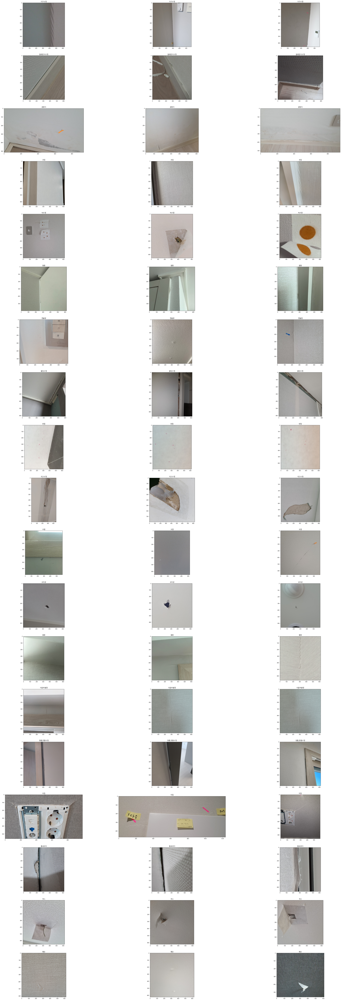

In [4]:
path = './data/train/*'
folder_list = glob(path)
f, axs = plt.subplots(len(folder_list), 2, figsize=(50, 140))
axs = axs.flatten()
num_sample = 3
smapling_img_list = []
for idx, f in enumerate(folder_list) :
    img_list = glob(os.path.join(f, '*'))
    sampling = np.random.choice(len(img_list), num_sample, replace=False)
    smapling_img_list.extend(np.array(img_list)[sampling].tolist())

for idx ,p in enumerate(smapling_img_list) :
    img_array = np.fromfile(p, np.uint8)
    img = cv2.imdecode(img_array, cv2.IMREAD_COLOR)
    img = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)
    axs[idx].imshow(img)
    axs[idx].set_title(p.split('\\')[-2])
    

plt.show()


## 이미지 가로 세로 길이 평균

In [5]:
path = './data/train/*/*'
img_list = glob(path)
img_size_dict = {}
for idx ,p in enumerate(tqdm(img_list)) :
    label = p.split('\\')[-2]
    img_array = np.fromfile(p, np.uint8)
    img = cv2.imdecode(img_array, cv2.IMREAD_COLOR)
    w, h = img.shape[:2]
    if label in img_size_dict.keys() :
        img_size_dict[label]["w"].append(w)
        img_size_dict[label]["h"].append(h)

    else :
        img_size_dict[label] = {
            "w" : [w],
            "h" : [h]
        }

for k, v in img_size_dict.items() :
    w = int(sum(img_size_dict[k]["w"]) / len(img_size_dict[k]["w"]))
    h = int(sum(img_size_dict[k]["h"]) / len(img_size_dict[k]["h"]))
    
    print(k + " >> \n" + "W : " + str(w) + " H : " + str(h))

100%|██████████| 3457/3457 [00:18<00:00, 185.72it/s]

가구수정 >> 
W : 660 H : 593
걸레받이수정 >> 
W : 600 H : 742
곰팡이 >> 
W : 595 H : 803
꼬임 >> 
W : 659 H : 617
녹오염 >> 
W : 658 H : 616
들뜸 >> 
W : 603 H : 621
면불량 >> 
W : 615 H : 711
몰딩수정 >> 
W : 617 H : 754
반점 >> 
W : 697 H : 618
석고수정 >> 
W : 640 H : 648
오염 >> 
W : 640 H : 610
오타공 >> 
W : 634 H : 612
울음 >> 
W : 666 H : 618
이음부불량 >> 
W : 666 H : 618
창틀,문틀수정 >> 
W : 668 H : 625
터짐 >> 
W : 623 H : 679
틈새과다 >> 
W : 666 H : 618
피스 >> 
W : 642 H : 627
훼손 >> 
W : 623 H : 615
